<a href="https://colab.research.google.com/github/tarishijain/Python/blob/master/Detectron2Cats_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: ignored

In [3]:
import json
import glob
import numpy as np

In [4]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 5.1 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=8fd66e5c97219dc29ce234851430d8deb5e40478ed7bbd798203bada7a5bc7cb
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 600 kB/s 
     |████████████████████████████████| 145 kB 7.6 MB/s 
     |████████████████████████████████| 130 kB 25.9 MB/s 
     |████████████████████████████████| 50 kB 5.8 MB/s 
     |████████████████████████████████| 74 kB 3.8 MB/s 
     |████████████████████████████████| 843 kB 54.4 MB/s 
     |████████████████████████████████

In [5]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [8]:
!unzip Cats.zip

Archive:  Cats.zip
  inflating: Cats/00000100_002.jpg   
  inflating: Cats/00000100_002.json  
  inflating: Cats/00000100_003.jpg   
  inflating: Cats/00000100_003.json  
  inflating: Cats/00000100_005.jpg   
  inflating: Cats/00000100_005.json  
  inflating: Cats/00000100_007.jpg   
  inflating: Cats/00000100_007.json  
  inflating: Cats/00000100_008.jpg   
  inflating: Cats/00000100_008.json  
  inflating: Cats/00000100_012.jpg   
  inflating: Cats/00000100_012.json  
  inflating: Cats/00000100_014.jpg   
  inflating: Cats/00000100_014.json  
  inflating: Cats/00000100_017.jpg   
  inflating: Cats/00000100_017.json  
  inflating: Cats/00000100_021.jpg   
  inflating: Cats/00000100_021.json  
  inflating: Cats/00000100_026.jpg   
  inflating: Cats/00000100_026.json  
  inflating: Cats/00000100_027.jpg   
  inflating: Cats/00000100_027.json  
  inflating: Cats/00000101_004.jpg   
  inflating: Cats/00000101_004.json  
  inflating: Cats/00000101_005.jpg   
  inflating: Cats/00000101_005.

In [9]:
categories_dict = {"cat" : 0}

In [54]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")
from detectron2.structures import BoxMode

def get_custom_dicts(img_dir):
    os.chdir(img_dir)
    count = 1
    file_list= []
    for file in glob.glob("*.json"):
        file_list.append(file)
    dataset_dicts = []
    for file in file_list:
        json_file_path = os.path.join(img_dir, file)
        with open(json_file_path) as f:
            img_json = json.load(f)

        record = {}
        path = img_json['imagePath']  
        path = path[14:]
        filename = os.path.join(img_dir,path )
        height, width = img_json['imageHeight'], img_json['imageWidth']
            
        record["file_name"] = filename
        record["image_id"] = count
        record["height"] = height
        record["width"] = width
        objs = []

        for i in range(len(img_json['shapes'])):
            points = img_json['shapes'][i]['points']
            mat = np.matrix(points)
            xmin,xmax,ymin,ymax = np.min(mat[:,0]), np.max(mat[:,0]), np.min(mat[:,1]), np.max(mat[:,1])
            poly = list(np.ravel(mat))
            obj = {
                "bbox": [xmin,ymin,xmax,ymax],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly], #list of list
                "category_id": categories_dict[img_json['shapes'][i]['label']],
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
        count+=1

    return dataset_dicts

In [55]:
d = 0
DatasetCatalog.register("cat", lambda d=d: get_custom_dicts("/content/Cats")) 
MetadataCatalog.get("cat").set(thing_classes=["cat"])
cats_metadata = MetadataCatalog.get("cat")

AssertionError: ignored

In [56]:
dataset_dicts = get_custom_dicts("/content/Cats")

In [46]:
print(dataset_dicts)

/content/Cats/00000103_026.jpg


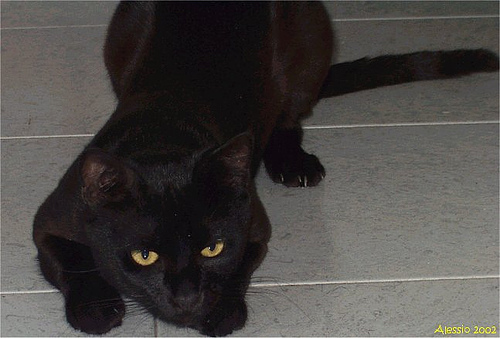

In [13]:
im = cv2.imread("/content/Cats/00000103_022.jpg")
cv2_imshow(im)

In [14]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

model_final_f10217.pkl: 178MB [00:04, 36.0MB/s]                           
/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [15]:
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([15], device='cuda:0')
Boxes(tensor([[ 32.2648,  12.6529, 340.0431, 337.1384]], device='cuda:0'))


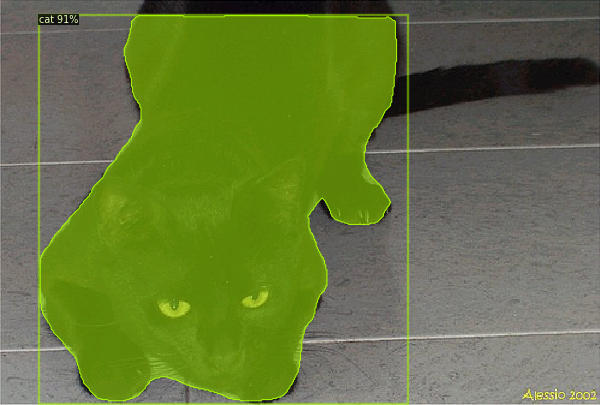

In [16]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

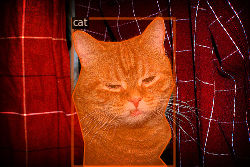

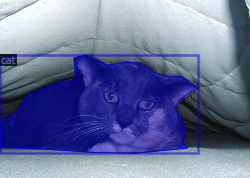

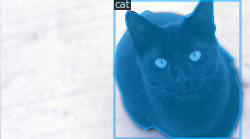

In [52]:
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=cats_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [57]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("cat",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[03/06 21:58:26 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[03/06 21:58:26 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[03/06 21:58:35 d2.utils.events]:  eta: 0:01:57  iter: 19  total_loss: 1.767  loss_cls: 0.6861  loss_box_reg: 0.3739  loss_mask: 0.688  loss_rpn_cls: 0.00256  loss_rpn_loc: 0.006043  time: 0.4285  data_time: 0.0199  lr: 1.6068e-05  max_mem: 3355M
[03/06 21:58:43 d2.utils.events]:  eta: 0:01:47  iter: 39  total_loss: 1.522  loss_cls: 0.4936  loss_box_reg: 0.3713  loss_mask: 0.6326  loss_rpn_cls: 0.001345  loss_rpn_loc: 0.006989  time: 0.4205  data_time: 0.0074  lr: 3.2718e-05  max_mem: 3355M
[03/06 21:58:52 d2.utils.events]:  eta: 0:01:40  iter: 59  total_loss: 1.235  loss_cls: 0.2995  loss_box_reg: 0.37  loss_mask: 0.535  loss_rpn_cls: 0.002646  loss_rpn_loc: 0.008172  time: 0.4241  data_time: 0.0088  lr: 4.9367e-05  max_mem: 3355M
[03/06 21:59:01 d2.utils.events]:  eta: 0:01:33  iter: 79  total_loss: 1.036  loss_cls: 0.2356  loss_box_reg: 0.3775  loss_mask: 0.41  loss_rpn_cls: 0.001509  loss_rpn_loc: 0.007249  time: 0.4272  data_time: 0.0099  lr: 6.6017e-05  max_mem: 3355M
[03/06 21:5

In [58]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [59]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

In [ ]:
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=cats_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


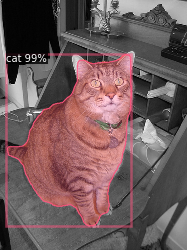

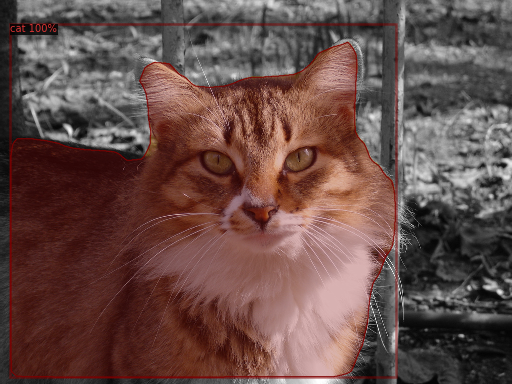

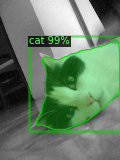

In [62]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_custom_dicts("/content/Cats")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=cats_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [66]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("cat", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "cat")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[03/06 22:11:56 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/06 22:11:56 d2.data.common]: Serializing 33 elements to byte tensors and concatenating them all ...
[03/06 22:11:56 d2.data.common]: Serialized dataset takes 0.06 MiB
[03/06 22:11:56 d2.evaluation.evaluator]: Start inference on 33 batches


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[03/06 22:11:57 d2.evaluation.evaluator]: Inference done 11/33. Dataloading: 0.0014 s/iter. Inference: 0.0961 s/iter. Eval: 0.0019 s/iter. Total: 0.0995 s/iter. ETA=0:00:02
[03/06 22:11:59 d2.evaluation.evaluator]: Total inference time: 0:00:03.024307 (0.108011 s / iter per device, on 1 devices)
[03/06 22:11:59 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:02 (0.100592 s / iter per device, on 1 devices)
[03/06 22:11:59 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[03/06 22:11:59 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[03/06 22:11:59 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[03/06 22:11:59 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[03/06 22:11:59 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[03/06 22:11:59 d2.evaluation.

model_final_a6e10b.pkl: 237MB [00:08, 29.5MB/s]                           
/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/detectron2/structures/keypoints.py:224: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, u

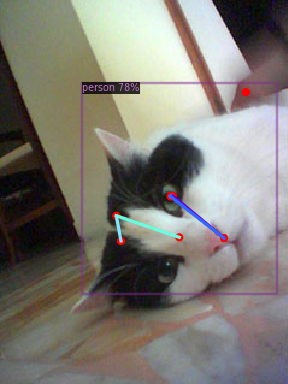

In [67]:
# Inference with a keypoint detection model
cfg = get_cfg()   # get a fresh new config
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)
v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

model_final_cafdb1.pkl: 261MB [00:07, 33.8MB/s]                           
/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


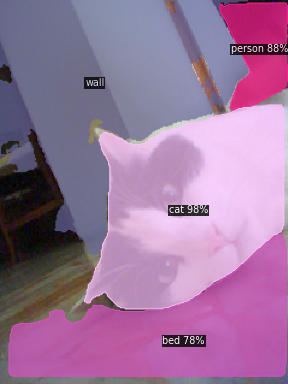

In [68]:
# Inference with a panoptic segmentation model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor = DefaultPredictor(cfg)
panoptic_seg, segments_info = predictor(im)["panoptic_seg"]
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)
cv2_imshow(out.get_image()[:, :, ::-1])